In [1]:
import glob
for path in glob.glob("**/data.mat", recursive=True):
    print(path)


exp/datasets/anes_data/simu/1/data.mat
exp/datasets/anes_data/simu/2/data.mat
exp/datasets/anes_data/simu/3/data.mat
exp/datasets/anes_data/simu/4/data.mat
exp/datasets/anes_data/vivo/data.mat


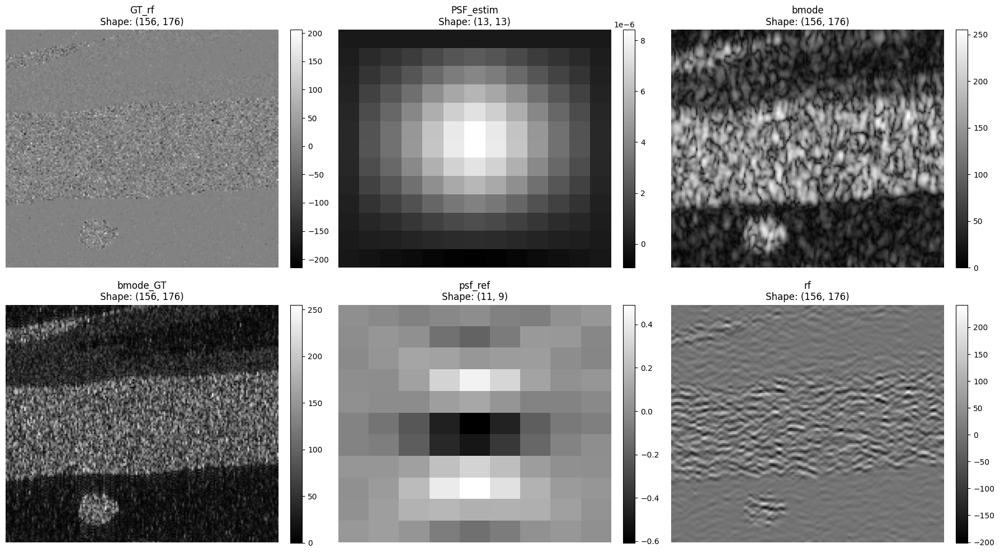

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# List of variable names to plot
variables_to_plot = ['GT_rf', 'PSF_estim', 'bmode', 'bmode_GT', 'psf_ref', 'rf']

# Create 2 rows × 3 columns subplot
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, var in enumerate(variables_to_plot):
    ax = axes[i]
    
    if var not in mat_data:
        ax.set_title(f"{var} (Not Found)")
        ax.axis('off')
        continue

    data = mat_data[var]
    
    # Slice third dimension if 3D
    if data.ndim == 3:
        img = data[:, :, 0]
    else:
        img = data

    im = ax.imshow(img, cmap='gray', aspect='auto')
    ax.set_title(f"{var}\nShape: {data.shape}")
    ax.axis('off')
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


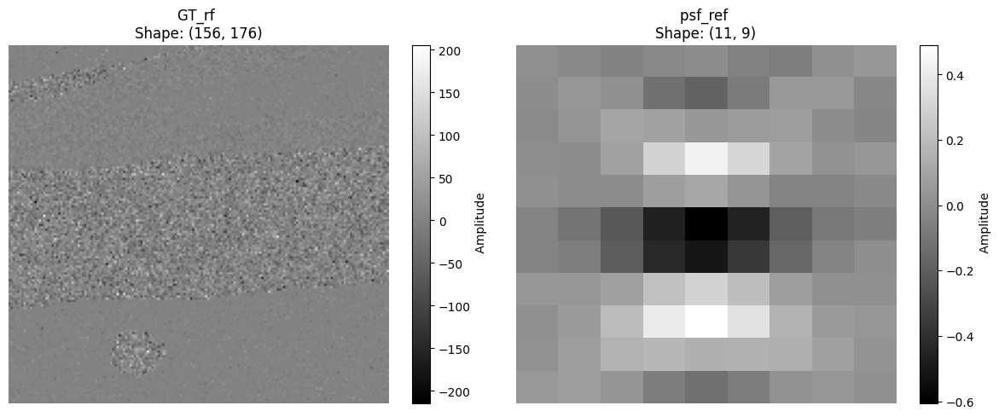

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# Extract data
gt_rf = mat_data["GT_rf"]
psf_ref = mat_data["psf_ref"]



# Plot side-by-side
plt.figure(figsize=(12, 5))

# --- GT_rf ---
plt.subplot(1, 2, 1)
plt.imshow(gt_rf, cmap='gray', aspect='auto')
plt.title(f"GT_rf \nShape: {gt_rf.shape}")
plt.colorbar(label=' Amplitude')
plt.axis('off')

# --- psf_ref ---
plt.subplot(1, 2, 2)
plt.imshow(psf_ref, cmap='gray', aspect='auto')
plt.title(f"psf_ref \nShape: {psf_ref.shape}")
plt.colorbar(label=' Amplitude')
plt.axis('off')

plt.tight_layout()
plt.show()


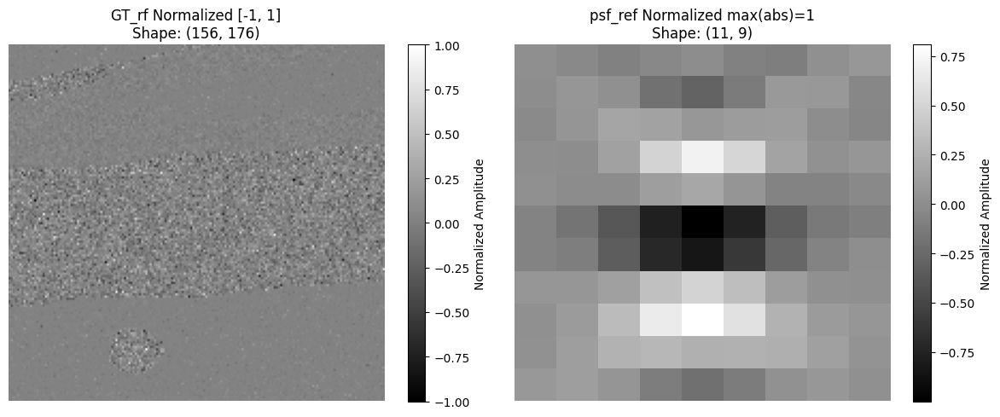

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.io

# Load .mat file
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
mat_data = scipy.io.loadmat(mat_path)

# Extract data
gt_rf = mat_data["GT_rf"]
psf_ref = mat_data["psf_ref"]

# Normalize GT_rf to [-1, 1]
gt_min, gt_max = gt_rf.min(), gt_rf.max()
gt_rf_norm = 2 * (gt_rf - gt_min) / (gt_max - gt_min + 1e-8) - 1  # Scale to [-1, 1]

# Normalize psf_ref so max(abs(.)) = 1
psf_ref_norm = psf_ref / (np.max(np.abs(psf_ref)) + 1e-8)

# Plot side-by-side
plt.figure(figsize=(12, 5))

# --- GT_rf (normalized to [-1, 1]) ---
plt.subplot(1, 2, 1)
plt.imshow(gt_rf_norm, cmap='gray', aspect='auto')
plt.title(f"GT_rf Normalized [-1, 1]\nShape: {gt_rf.shape}")
plt.colorbar(label='Normalized Amplitude')
plt.axis('off')

# --- psf_ref (normalized max(abs)=1) ---
plt.subplot(1, 2, 2)
plt.imshow(psf_ref_norm, cmap='gray', aspect='auto')
plt.title(f"psf_ref Normalized max(abs)=1\nShape: {psf_ref.shape}")
plt.colorbar(label='Normalized Amplitude')
plt.axis('off')

plt.tight_layout()
plt.show()


In [5]:
import os
import scipy.io

# Create output directory if it doesn't exist
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)

# Save normalized PSF
save_path = os.path.join(output_dir, "psf_ref_norm.mat")
scipy.io.savemat(save_path, {"psf_ref_norm": psf_ref_norm})

print(f"✅ Normalized PSF saved to: {save_path}")


✅ Normalized PSF saved to: input/Simu/1/psf_ref_norm.mat


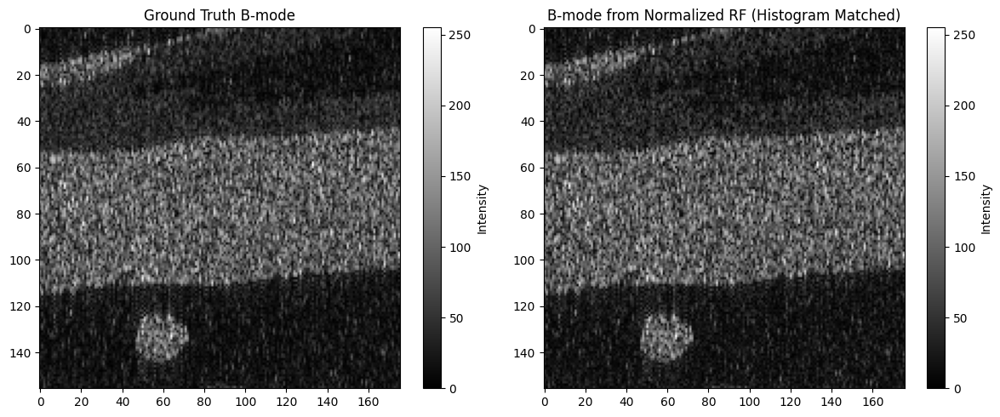

In [6]:
from skimage.exposure import match_histograms
from scipy.signal import hilbert

# Load GT B-mode for histogram reference
gt_bmode = mat_data["bmode_GT"]

# Redefine the rf_to_matched_bmode function
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# Apply B-mode conversion with histogram matching
matched_bmode = rf_to_matched_bmode(gt_rf_norm, gt_bmode)

# Visualize matched B-mode and ground truth B-mode side-by-side
plt.figure(figsize=(12, 5))

# Ground truth B-mode
plt.subplot(1, 2, 1)
plt.imshow(gt_bmode, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode")
plt.colorbar(label='Intensity')

# Histogram matched B-mode
plt.subplot(1, 2, 2)
plt.imshow(matched_bmode, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized RF (Histogram Matched)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


 ### DDRM Restoration

✅ Resized & normalized RF GT saved to: input/Simu/1/resized_rf_gt.mat


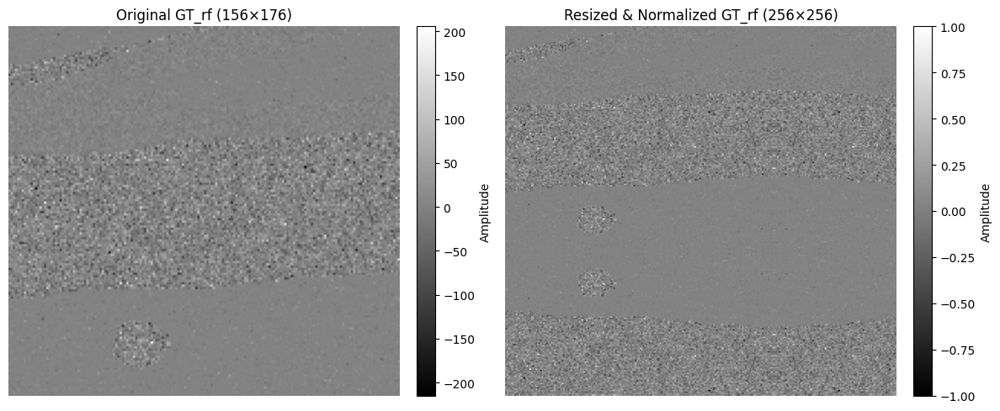

In [7]:
import numpy as np
import scipy.io
import os
import matplotlib.pyplot as plt

# Step 1: Load original RF data
mat_path = "exp/datasets/anes_data/simu/1/data.mat"
data = scipy.io.loadmat(mat_path)
gt_rf = data['GT_rf']  # Shape: (156, 176)

# Step 2: Resize to 256x256 using mirroring
target_h, target_w = 256, 256
h, w = gt_rf.shape

gt_rf_resized = gt_rf.copy()
while gt_rf_resized.shape[1] < target_w:
    to_add = np.fliplr(gt_rf_resized)[:, :min(target_w - gt_rf_resized.shape[1], w)]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=1)

while gt_rf_resized.shape[0] < target_h:
    to_add = np.flipud(gt_rf_resized)[:min(target_h - gt_rf_resized.shape[0], h), :]
    gt_rf_resized = np.concatenate((gt_rf_resized, to_add), axis=0)

# Step 3: Normalize to [-1, 1]
min_val, max_val = gt_rf_resized.min(), gt_rf_resized.max()
gt_rf_resized = 2 * (gt_rf_resized - min_val) / (max_val - min_val + 1e-8) - 1

# Step 4: Save resized and normalized RF
output_dir = "input/Simu/1"
os.makedirs(output_dir, exist_ok=True)
save_path = os.path.join(output_dir, "resized_rf_gt.mat")
scipy.io.savemat(save_path, {"GT_rf_resized": gt_rf_resized})
print(f"✅ Resized & normalized RF GT saved to: {save_path}")

# Step 5: Visualization function
def show_rf_with_colorbar(data, title, ax):
    img = ax.imshow(data, cmap='gray', aspect='auto')
    ax.set_title(title)
    ax.axis('off')
    plt.colorbar(img, ax=ax, fraction=0.046, pad=0.04, label="Amplitude")

# Step 6: Plot original and resized RF
fig, axes = plt.subplots(1, 2, figsize=(12, 5))
show_rf_with_colorbar(gt_rf, f"Original GT_rf ({h}×{w})", axes[0])
show_rf_with_colorbar(gt_rf_resized, "Resized & Normalized GT_rf (256×256)", axes[1])

plt.tight_layout()
plt.show()


In [8]:
print(gt_rf_resized.shape)

(256, 256)


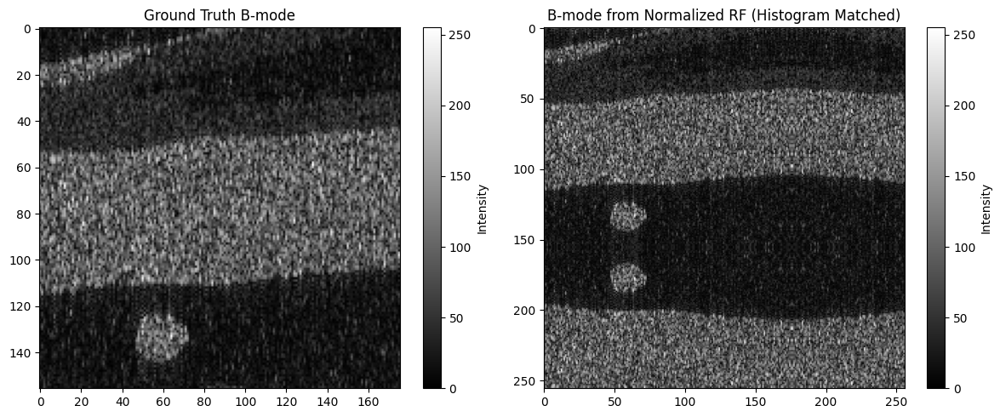

In [9]:
from skimage.exposure import match_histograms
from scipy.signal import hilbert

# Load GT B-mode for histogram reference
gt_bmode = mat_data["bmode_GT"]

# Redefine the rf_to_matched_bmode function
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# Apply B-mode conversion with histogram matching
matched_bmode = rf_to_matched_bmode(gt_rf_resized, gt_bmode)

# Visualize matched B-mode and ground truth B-mode side-by-side
plt.figure(figsize=(12, 5))

# Ground truth B-mode
plt.subplot(1, 2, 1)
plt.imshow(gt_bmode, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode")
plt.colorbar(label='Intensity')

# Histogram matched B-mode
plt.subplot(1, 2, 2)
plt.imshow(matched_bmode, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized RF (Histogram Matched)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


✅ Saved degraded RF with BCCB + noise to input/Simu/1/degraded_y0.mat


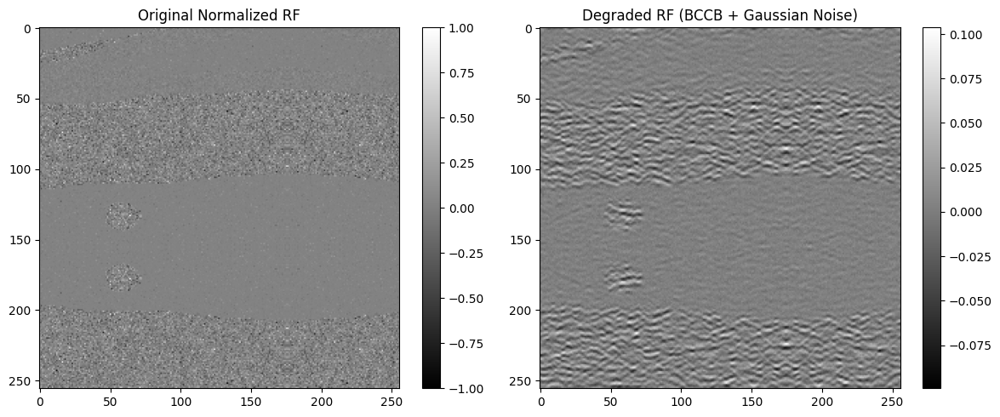

In [10]:
import numpy as np
import scipy.io
from numpy.fft import fft2, ifft2, fftshift
import matplotlib.pyplot as plt

# === Load normalized resized RF and PSF ===
rf_data = scipy.io.loadmat("input/Simu/1/resized_rf_gt.mat")  # (256, 256)
gt_rf = rf_data["GT_rf_resized"]

psf_data = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
psf = psf_data["psf_ref"]
psf = psf / (np.sum(np.abs(psf)) + 1e-8)  # Normalize PSF

# === Pad and center PSF to match RF size ===
H, W = gt_rf.shape
psf_padded = np.zeros((H, W), dtype=np.float32)
ph, pw = psf.shape
psf_padded[:ph, :pw] = psf

# Center the PSF in the frequency domain
psf_padded = np.roll(np.roll(psf_padded, -ph // 2, axis=0), -pw // 2, axis=1)

# === FFT of the PSF (for BCCB convolution) ===
H_fft = fft2(psf_padded)

# === Degrade the RF using BCCB convolution ===
Y_fft = H_fft * fft2(gt_rf)
y = np.real(ifft2(Y_fft))

# === Add Gaussian noise ===
noise_std = 0.003508  # Set SNR here
noise = np.random.normal(0, noise_std, size=y.shape).astype(np.float32)
y_noisy = y + noise

# === Save degraded RF ===
scipy.io.savemat("input/Simu/1/degraded_y0.mat", {"rf_degraded": y_noisy})
print("✅ Saved degraded RF with BCCB + noise to input/Simu/1/degraded_y0.mat")

# === Visualize original vs degraded ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(gt_rf, cmap='gray', aspect='auto')
plt.title("Original Normalized RF")
plt.colorbar()

plt.subplot(1, 2, 2)
y_noisy = np.clip(y_noisy, -1.0, 1.0)
plt.imshow(y_noisy, cmap='gray', aspect='auto')
plt.title("Degraded RF (BCCB + Gaussian Noise)")
plt.colorbar()

plt.tight_layout()
plt.show()


In [11]:
import os

# Define the target folder
target_folder = "input/Simu/1"
os.makedirs(target_folder, exist_ok=True)

# Path to mat_list.txt
mat_list_path = os.path.join(target_folder, "mat_list.txt")

# Write the filename to the text file
with open(mat_list_path, "w") as f:
    f.write("resized_rf_gt.mat\n")

print(f"✅ 'mat_list.txt' created at: {mat_list_path}")


✅ 'mat_list.txt' created at: input/Simu/1/mat_list.txt


In [12]:
import os

# Define the target folder and file names
target_folder = "input/Simu/1"
mat_filename = "resized_rf_gt.mat"
mat_list_path = os.path.join(target_folder, "mat_list.txt")
mat_file_path = os.path.join(target_folder, mat_filename)

# Step 1: Ensure the target directory exists
os.makedirs(target_folder, exist_ok=True)

# Step 2: Write the filename to mat_list.txt
with open(mat_list_path, "w") as f:
    f.write(mat_filename + "\n")

print(f"✅ 'mat_list.txt' created at: {mat_list_path}")

# Step 3: Verify that the .mat file exists
if os.path.isfile(mat_file_path):
    print(f"✅ Found required .mat file: {mat_file_path}")
else:
    print(f"⚠️ WARNING: '{mat_filename}' does NOT exist in {target_folder}.")


✅ 'mat_list.txt' created at: input/Simu/1/mat_list.txt
✅ Found required .mat file: input/Simu/1/resized_rf_gt.mat


In [3]:
!python apply_degradation.py \
  --mat_dir input/Simu/1 \
  --mat_list input/Simu/1/mat_list.txt \
  --psf_path exp/datasets/anes_data/simu/1/psf_GT_1.mat \
  --output_dir input/Simu/1/ddrm_out \
  --key GT_rf_resized \
  --image_size 256 \
  --sigma_0 0.01


Using device: cuda
✅ Found PSF key: psf_ref
✅ Saved:
   • ground_truth.mat   (GT_rf_resized)
   • degraded_y0.mat    (rf_degraded)


In [34]:
import numpy as np, scipy.io, math, textwrap
from numpy.fft import fft2, ifft2
import os

# ── paths ─────────────────────────────────────────────────────────
base_dir = "input/Simu/1/ddrm_out"
gt_path  = os.path.join(base_dir, "ground_truth.mat")     # saved by script
y0_path  = os.path.join(base_dir, "degraded_y0.mat")      # saved by script
psf_path = "exp/datasets/anes_data/simu/1/psf_GT_1.mat"   # same PSF you used

# ── helpers ───────────────────────────────────────────────────────
def bccb_conv(img, psf):
    """2-D circular convolution via FFT (same operator H used in the script)."""
    H, W = img.shape
    Mh, Nw = psf.shape
    centre = (Mh//2, Nw//2)
    pad    = np.zeros_like(img)
    pad[:Mh, :Nw] = psf
    pad = np.roll(pad, (-centre[0], -centre[1]), axis=(0,1))
    return np.real(ifft2(fft2(img) * fft2(pad)))

def snr_db(ref, test):
    return 10*np.log10(np.sum(ref**2) / (np.sum((ref-test)**2) + 1e-12))

# ── load data ─────────────────────────────────────────────────────
rf_gt       = scipy.io.loadmat(gt_path)["GT_rf_resized"]
rf_degraded = scipy.io.loadmat(y0_path)["rf_degraded"]

psf_mat = scipy.io.loadmat(psf_path)
psf_key = next(k for k,v in psf_mat.items()
               if not k.startswith("__") and isinstance(v, np.ndarray))
psf     = psf_mat[psf_key].astype(np.float32)

# ── compute H(x) (blur only) ─────────────────────────────────────
rf_hx = bccb_conv(rf_gt, psf)

sigma_measured = math.sqrt(np.mean((rf_hx - rf_degraded)**2))
snr_full  = snr_db(rf_gt, rf_degraded)   # blur + noise vs original
snr_noise = snr_db(rf_hx, rf_degraded)   # noise only vs blur

print(textwrap.dedent(f"""
    σ you asked for (command)        : 0.01
    σ actually measured (std)        : {sigma_measured:.5f}

    SNR (original x  vs  y0)         : {snr_full:.2f} dB
        • counts both PSF blur and Gaussian noise

    SNR (blurred H(x) vs  y0)        : {snr_noise:.2f} dB
        • isolates the effect of the Gaussian noise only
"""))



σ you asked for (command)        : 0.01
σ actually measured (std)        : 0.01000

SNR (original x  vs  y0)         : -6.88 dB
    • counts both PSF blur and Gaussian noise

SNR (blurred H(x) vs  y0)        : 25.41 dB
    • isolates the effect of the Gaussian noise only



In [6]:
sigma_target = np.sqrt( (rf_hx**2).sum() / (rf_hx.size * 10**(10/10)) )
print(sigma_target)   # ≈ 0.097


0.05895850773616171


In [21]:
!python apply_degradation.py \
    --mat_dir input/Simu/1 \
    --mat_list input/Simu/1/mat_list.txt \
    --psf_path exp/datasets/anes_data/simu/1/psf_GT_1.mat \
    --output_dir input/Simu/1/ddrm_out \
    --key GT_rf_resized \
    --image_size 256 \
    --sigma_0 0.01


Using device: cuda
✅ Found PSF key: psf_ref
✅ Saved:
   • ground_truth.mat   (GT_rf_resized)
   • degraded_y0.mat    (rf_degraded)


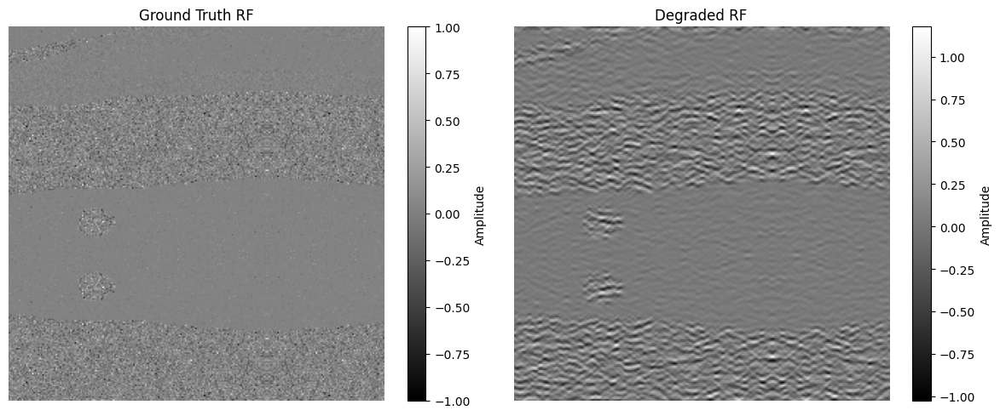

In [22]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load RF data from MAT files
base_path = "input/Simu/1/ddrm_out"
rf_gt = scipy.io.loadmat(f"{base_path}/ground_truth.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat(f"{base_path}/degraded_y0.mat")["rf_degraded"]

# Plot raw RF signals
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(rf_gt, cmap='gray', aspect='auto')
plt.title("Ground Truth RF")
plt.colorbar(label="Amplitude")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(rf_degraded, cmap='gray', aspect='auto')
plt.title("Degraded RF")
plt.colorbar(label="Amplitude")
plt.axis("off")

plt.tight_layout()
plt.show()


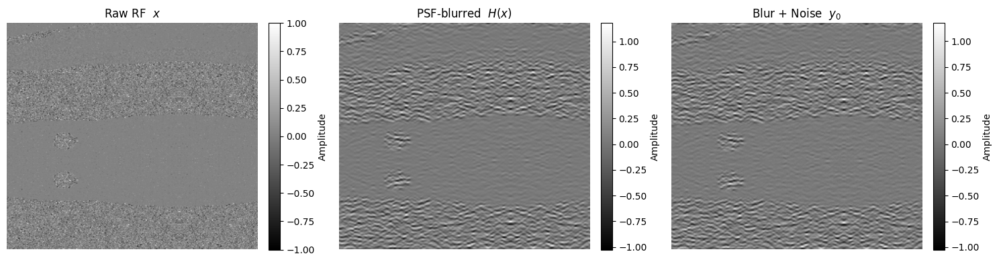

In [23]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
import os

# -------------------------------------------------------
# Paths (edit here if your folder names change)
# -------------------------------------------------------
base_dir = "input/Simu/1/ddrm_out"
gt_path  = os.path.join(base_dir, "ground_truth.mat")
y0_path  = os.path.join(base_dir, "degraded_y0.mat")
psf_path = "exp/datasets/anes_data/simu/1/psf_GT_1.mat"

# -------------------------------------------------------
# Helper: circular (BCCB) convolution using FFT
# -------------------------------------------------------
def bccb_conv(img, psf):
    H, W        = img.shape
    Mh, Nw      = psf.shape
    centred_psf = np.zeros_like(img)
    centred_psf[:Mh, :Nw] = psf
    centred_psf = np.roll(centred_psf, (-Mh//2, -Nw//2), axis=(0,1))
    return np.real(ifft2(fft2(img) * fft2(centred_psf)))

# -------------------------------------------------------
# Load data
# -------------------------------------------------------
rf_gt       = scipy.io.loadmat(gt_path)["GT_rf_resized"]
rf_degraded = scipy.io.loadmat(y0_path)["rf_degraded"]

psf_mat = scipy.io.loadmat(psf_path)
psf_key = next(k for k,v in psf_mat.items()
               if not k.startswith("__") and isinstance(v, np.ndarray))
psf = psf_mat[psf_key].astype(np.float32)

# Compute PSF‑blurred signal H(x)
rf_hx = bccb_conv(rf_gt, psf)

# -------------------------------------------------------
# Visualise side‑by‑side
# -------------------------------------------------------
fig, axs = plt.subplots(1, 3, figsize=(15, 4))

titles = ["Raw RF  $x$", "PSF‑blurred  $H(x)$", "Blur + Noise  $y_0$"]
imgs   = [rf_gt, rf_hx, rf_degraded]

for ax, img, title in zip(axs, imgs, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Amplitude")

plt.tight_layout()
plt.show()


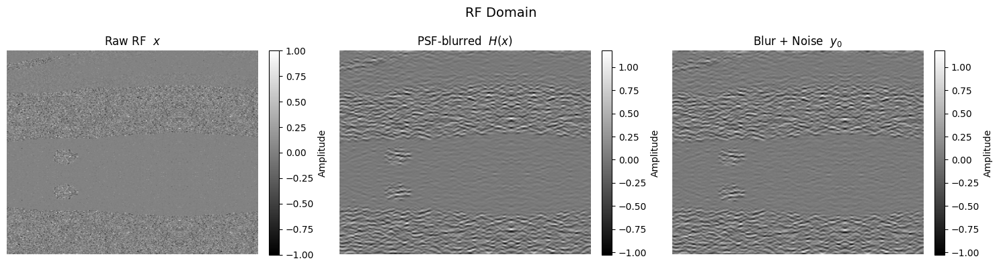

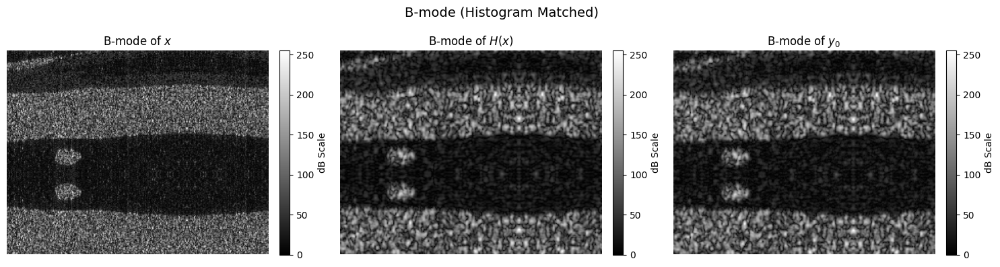

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.exposure import match_histograms
from scipy.signal import hilbert
import scipy.io

# -------------------------------------------------------
# Load MAT data
# -------------------------------------------------------
base = "input/Simu/1/ddrm_out"
mat_data  = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")

rf_gt       = scipy.io.loadmat(f"{base}/ground_truth.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat(f"{base}/degraded_y0.mat")["rf_degraded"]

# === Apply PSF only ===
psf = mat_data["psf_ref"]
psf = psf / psf.sum()
from numpy.fft import fft2, ifft2
H, W = rf_gt.shape
psf_padded = np.zeros((H, W), dtype=np.float32)
ph, pw = psf.shape
psf_padded[:ph, :pw] = psf
psf_padded = np.roll(np.roll(psf_padded, -ph // 2, axis=0), -pw // 2, axis=1)
H_fft = fft2(psf_padded)
rf_hx = np.real(ifft2(H_fft * fft2(rf_gt)))

# -------------------------------------------------------
# Histogram-matched B-mode conversion
# -------------------------------------------------------
gt_bmode = mat_data["bmode_GT"]

def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

bmode_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
bmode_hx       = rf_to_matched_bmode(rf_hx, gt_bmode)
bmode_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)

# -------------------------------------------------------
# 1. RF Visualization
# -------------------------------------------------------
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = ["Raw RF  $x$", "PSF‑blurred  $H(x)$", "Blur + Noise  $y_0$"]
imgs   = [rf_gt, rf_hx, rf_degraded]

for ax, img, title in zip(axs, imgs, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Amplitude")

plt.suptitle("RF Domain", fontsize=14)
plt.tight_layout()
plt.show()

# -------------------------------------------------------
# 2. B-mode Visualization
# -------------------------------------------------------
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = ["B-mode of $x$", "B-mode of $H(x)$", "B-mode of $y_0$"]
imgs   = [bmode_gt, bmode_hx, bmode_degraded]

for ax, img, title in zip(axs, imgs, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="dB Scale")

plt.suptitle("B-mode (Histogram Matched)", fontsize=14)
plt.tight_layout()
plt.show()


In [14]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# === Load RF data ===
base_path = "input/Simu/1/ddrm_out"
rf_gt = scipy.io.loadmat(f"{base_path}/ground_truth.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat(f"{base_path}/degraded_y0.mat")["rf_degraded"]

# === Function to compute SNR in dB ===
def compute_snr_db(gt, degraded):
    signal_power = np.sum(gt ** 2)
    noise_power = np.sum((gt - degraded) ** 2)
    snr = 10 * np.log10(signal_power / (noise_power + 1e-12))  # small epsilon to avoid divide-by-zero
    return snr

# === Compute and print SNR ===
snr_db = compute_snr_db(rf_gt, rf_degraded)
print(f"📶 SNR = {snr_db:.2f} dB")


📶 SNR = -7.11 dB


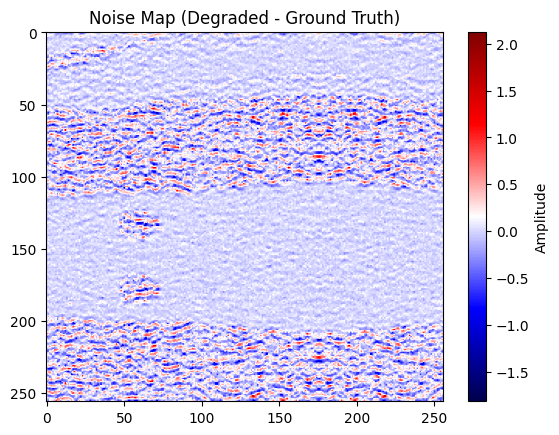

In [15]:
noise = rf_degraded - rf_gt
plt.imshow(noise, cmap='seismic', aspect='auto')
plt.title("Noise Map (Degraded - Ground Truth)")
plt.colorbar(label="Amplitude")
plt.show()


###  DDRM Restoration CODE 

In [36]:
!python ddrm_old.py \
  --degraded_mat input/Simu/1/ddrm_out/degraded_y0.mat \
  --gt_mat       input/Simu/1/ddrm_out/ground_truth.mat \
  --psf_path     exp/datasets/anes_data/simu/1/psf_GT_1.mat \
  --model_path   exp/logs/imagenet/256x256_diffusion_uncond.pt \
  --config       deblur_us.yml \
  --timesteps    100 \
  --eta          0.85 \
  --etaB         1.0 \
  --sigma_0      0.01 \
  --output_dir   input/Simu/1/ddrm_out


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
✅ PSF loaded (key='psf_ref', shape=(11, 9))
INFO - main.py - 2025-05-26 11:11:49,173 - Using device: cuda
✅ Model checkpoint loaded
100it [00:44,  2.27it/s]
✅ Saved input/Simu/1/ddrm_out/restored_ddrm.mat (restored RF in [-1, 1])
PSNR: 27.97 dB   SSIM: 0.7318


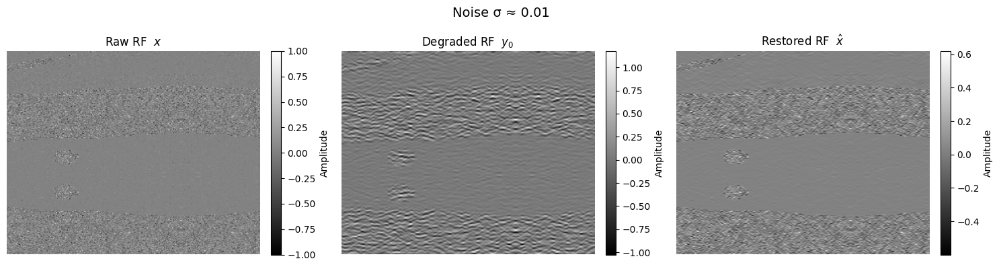

In [37]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2

# === Load RF data ===
base_path = "input/Simu/1/ddrm_out"
rf_gt       = scipy.io.loadmat(f"{base_path}/ground_truth.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat(f"{base_path}/degraded_y0.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat(f"{base_path}/restored_ddrm.mat")["rf_restored"]
psf         = scipy.io.loadmat("exp/datasets/anes_data/simu/1/psf_GT_1.mat")["psf_ref"]

sigma = 0.01

# === Plot side-by-side ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = ["Raw RF  $x$", "Degraded RF  $y_0$", "Restored RF  $\hat{x}$"]
images = [rf_gt, rf_degraded, rf_restored]

for ax, img, title in zip(axs, images, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Amplitude")

plt.suptitle(f"Noise σ ≈ {sigma:.2f}", fontsize=14)
plt.tight_layout()
plt.show()


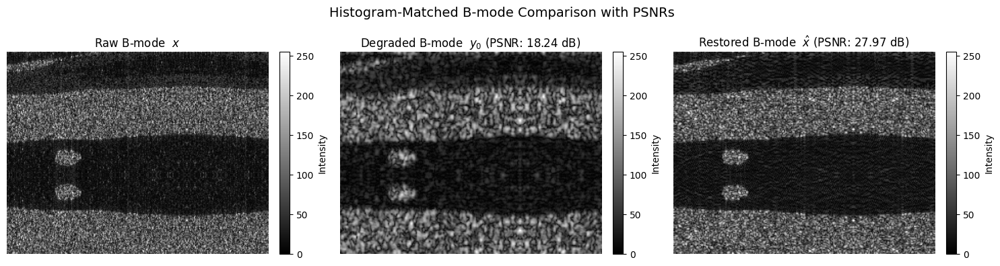

In [38]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio

# === Load Data ===
base_path = "input/Simu/1/ddrm_out"
rf_gt        = scipy.io.loadmat(f"{base_path}/ground_truth.mat")["GT_rf_resized"]
rf_degraded  = scipy.io.loadmat(f"{base_path}/degraded_y0.mat")["rf_degraded"]
rf_restored  = scipy.io.loadmat(f"{base_path}/restored_ddrm.mat")["rf_restored"]
gt_bmode     = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === PSNR Computation ===
psnr_deg  = peak_signal_noise_ratio(rf_gt, rf_degraded, data_range=rf_gt.max() - rf_gt.min())
psnr_rest = peak_signal_noise_ratio(rf_gt, rf_restored, data_range=2.0)  # restored is in [-1, 1]

# === Helper: Convert RF to histogram-matched B-mode ===
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Convert all to B-mode ===
b_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
b_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
b_restored = rf_to_matched_bmode(rf_restored, gt_bmode)

# === Plot ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "Raw B-mode  $x$",
    f"Degraded B-mode  $y_0$ (PSNR: {psnr_deg:.2f} dB)",
    f"Restored B-mode  $\hat{{x}}$ (PSNR: {psnr_rest:.2f} dB)"
]
images = [b_gt, b_degraded, b_restored]

for ax, img, title in zip(axs, images, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04, label="Intensity")

plt.suptitle("Histogram-Matched B-mode Comparison with PSNRs", fontsize=14)
plt.tight_layout()
plt.show()


In [1]:
import numpy as np, scipy.io, math, textwrap
from numpy.fft import fft2, ifft2
from skimage.metrics import peak_signal_noise_ratio

# ── Load paths ──────────────────────────────
gt        = scipy.io.loadmat("input/Simu/1/ddrm_out/ground_truth.mat")["GT_rf_resized"]
degraded  = scipy.io.loadmat("input/Simu/1/ddrm_out/degraded_y0.mat")["rf_degraded"]
restored  = scipy.io.loadmat("input/Simu/1/ddrm_out/restored_ddrm.mat")["rf_restored"]
psf       = scipy.io.loadmat("exp/datasets/anes_data/simu/1/psf_GT_1.mat")["psf_ref"]

# ── Functions ───────────────────────────────
def bccb_conv(img, psf):
    H, W = img.shape
    Mh, Nw = psf.shape
    pad = np.zeros_like(img)
    pad[:Mh, :Nw] = psf
    pad = np.roll(pad, (-Mh//2, -Nw//2), axis=(0,1))
    return np.real(ifft2(fft2(img) * fft2(pad)))

def snr_db(ref, test):
    return 10 * np.log10(np.sum(ref**2) / (np.sum((ref - test)**2) + 1e-12))

# ── Compute PSF-blurred GT ─────────────────
blurred = bccb_conv(gt, psf)

# ── Compute noise std ──────────────────────
sigma = np.sqrt(np.mean((blurred - degraded)**2))

# ── SNR + PSNR ─────────────────────────────
snr_degraded = snr_db(gt, degraded)
snr_restored = snr_db(gt, restored)
psnr_degraded = peak_signal_noise_ratio(gt, degraded, data_range=gt.max() - gt.min())
psnr_restored = peak_signal_noise_ratio(gt, restored, data_range=gt.max() - gt.min())

# ── Print results ──────────────────────────
print(textwrap.dedent(f"""
    σ (noise std estimated from H(x) vs y₀) : {sigma:.5f}

    Degraded RF:
      • SNR  (vs GT)  : {snr_degraded:.2f} dB
      • PSNR (vs GT)  : {psnr_degraded:.2f} dB

    DDRM Restored RF:
      • SNR  (vs GT)  : {snr_restored:.2f} dB
      • PSNR (vs GT)  : {psnr_restored:.2f} dB
"""))



σ (noise std estimated from H(x) vs y₀) : 0.22071

Degraded RF:
  • SNR  (vs GT)  : -6.88 dB
  • PSNR (vs GT)  : 18.24 dB

DDRM Restored RF:
  • SNR  (vs GT)  : 2.86 dB
  • PSNR (vs GT)  : 27.97 dB




Command σ₀                           : 0.01
Measured σ (std of noise)           : 0.22071

Degraded RF:
  SNR   (vs GT)                     : -6.88 dB
  PSNR  (vs GT)                     : 18.24 dB

DDRM Restored RF:
  SNR   (vs GT)                     : 2.86 dB
  PSNR  (vs GT)                     : 27.97 dB



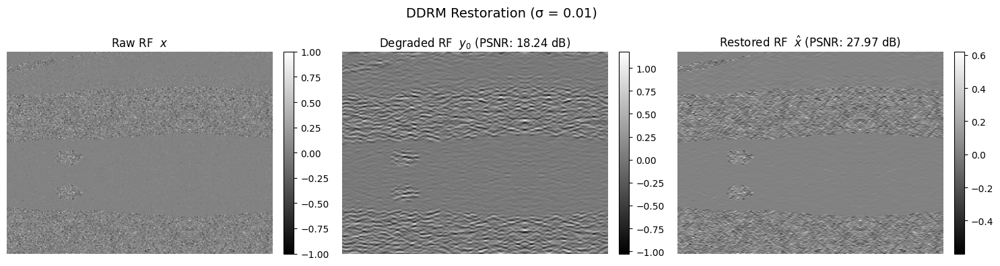

In [2]:
import numpy as np
import scipy.io
from numpy.fft import fft2, ifft2
from skimage.metrics import peak_signal_noise_ratio
import matplotlib.pyplot as plt
import textwrap

# === Load RF Data ===
rf_gt       = scipy.io.loadmat("input/Simu/1/ddrm_out/ground_truth.mat")["GT_rf_resized"]
rf_degraded = scipy.io.loadmat("input/Simu/1/ddrm_out/degraded_y0.mat")["rf_degraded"]
rf_restored = scipy.io.loadmat("input/Simu/1/ddrm_out/restored_ddrm.mat")["rf_restored"]
psf         = scipy.io.loadmat("exp/datasets/anes_data/simu/1/psf_GT_1.mat")["psf_ref"]

# === Helper: BCCB PSF blur operator ===
def bccb_conv(img, psf):
    Mh, Nw = psf.shape
    padded = np.zeros_like(img)
    padded[:Mh, :Nw] = psf
    pad_shift = np.roll(padded, (-Mh // 2, -Nw // 2), axis=(0, 1))
    return np.real(ifft2(fft2(img) * fft2(pad_shift)))

# === Helper: SNR ===
def snr_db(ref, test):
    return 10 * np.log10(np.sum(ref**2) / (np.sum((ref - test)**2) + 1e-12))

# === Compute H(x), noise std, SNR/PSNR ===
rf_hx = bccb_conv(rf_gt, psf)
sigma_measured = np.sqrt(np.mean((rf_hx - rf_degraded)**2))

snr_degraded  = snr_db(rf_gt, rf_degraded)
snr_restored  = snr_db(rf_gt, rf_restored)
psnr_degraded = peak_signal_noise_ratio(rf_gt, rf_degraded, data_range=rf_gt.max() - rf_gt.min())
psnr_restored = peak_signal_noise_ratio(rf_gt, rf_restored, data_range=rf_gt.max() - rf_gt.min())

# === Print Results ===
print(textwrap.dedent(f"""
    Command σ₀                           : 0.01
    Measured σ (std of noise)           : {sigma_measured:.5f}

    Degraded RF:
      SNR   (vs GT)                     : {snr_degraded:.2f} dB
      PSNR  (vs GT)                     : {psnr_degraded:.2f} dB

    DDRM Restored RF:
      SNR   (vs GT)                     : {snr_restored:.2f} dB
      PSNR  (vs GT)                     : {psnr_restored:.2f} dB
"""))

# === Visualize Raw RF ===
titles = [
    "Raw RF  $x$",
    f"Degraded RF  $y_0$ (PSNR: {psnr_degraded:.2f} dB)",
    f"Restored RF  $\hat{{x}}$ (PSNR: {psnr_restored:.2f} dB)"
]
images = [rf_gt, rf_degraded, rf_restored]

fig, axs = plt.subplots(1, 3, figsize=(15, 4))
for ax, img, title in zip(axs, images, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle("DDRM Restoration (σ = 0.01)", fontsize=14)
plt.tight_layout()
plt.show()


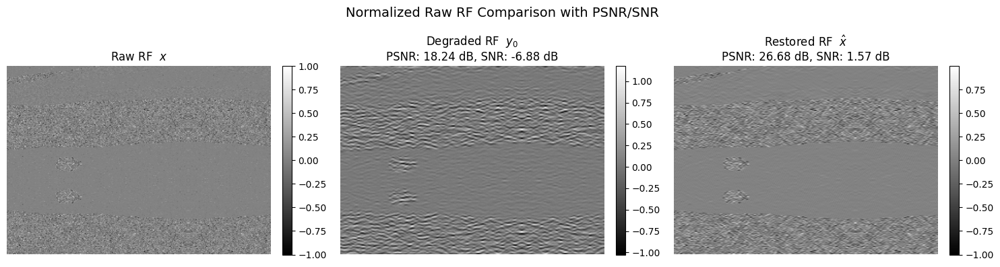

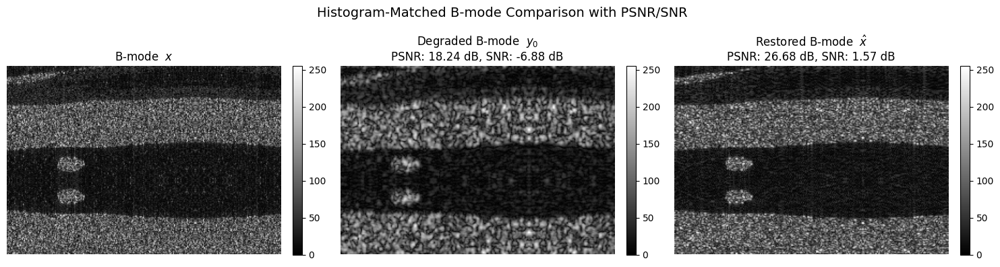

In [3]:
# Re-import needed libraries after kernel reset
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio
import os

# === Helper Functions ===
def normalize_to_minus1_1(x: np.ndarray) -> np.ndarray:
    x_min = x.min()
    x_max = x.max()
    return 2 * (x - x_min) / (x_max - x_min + 1e-8) - 1

def rf_to_matched_bmode(RF, GT_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + increase)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

def snr_db(ref, test):
    return 10 * np.log10(np.sum(ref**2) / (np.sum((ref - test)**2) + 1e-12))

# === Load Data ===
base_path = "input/Simu/1/ddrm_out"
rf_gt        = scipy.io.loadmat(os.path.join(base_path, "ground_truth.mat"))["GT_rf_resized"]
rf_degraded  = scipy.io.loadmat(os.path.join(base_path, "degraded_y0.mat"))["rf_degraded"]
rf_restored  = scipy.io.loadmat(os.path.join(base_path, "restored_ddrm.mat"))["rf_restored"]
gt_bmode     = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === Normalize RFs ===
rf_restored = normalize_to_minus1_1(rf_restored)

# === Compute Metrics ===
psnr_degraded = peak_signal_noise_ratio(rf_gt, rf_degraded, data_range=rf_gt.max() - rf_gt.min())
psnr_restored = peak_signal_noise_ratio(rf_gt, rf_restored, data_range=2.0)
snr_degraded = snr_db(rf_gt, rf_degraded)
snr_restored = snr_db(rf_gt, rf_restored)

# === Convert to B-mode ===
b_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
b_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
b_restored = rf_to_matched_bmode(rf_restored, gt_bmode)

# === Visualize Raw RF ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "Raw RF  $x$",
    f"Degraded RF  $y_0$\nPSNR: {psnr_degraded:.2f} dB, SNR: {snr_degraded:.2f} dB",
    f"Restored RF  $\hat{{x}}$\nPSNR: {psnr_restored:.2f} dB, SNR: {snr_restored:.2f} dB"
]
images = [rf_gt, rf_degraded, rf_restored]

for ax, img, title in zip(axs, images, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle("Normalized Raw RF Comparison with PSNR/SNR", fontsize=14)
plt.tight_layout()
plt.show()

# === Visualize B-mode ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "B-mode  $x$",
    f"Degraded B-mode  $y_0$\nPSNR: {psnr_degraded:.2f} dB, SNR: {snr_degraded:.2f} dB",
    f"Restored B-mode  $\hat{{x}}$\nPSNR: {psnr_restored:.2f} dB, SNR: {snr_restored:.2f} dB"
]
images = [b_gt, b_degraded, b_restored]

for ax, img, title in zip(axs, images, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle("Histogram-Matched B-mode Comparison with PSNR/SNR", fontsize=14)
plt.tight_layout()
plt.show()


✅ Restored RF saved to input/Simu/1/restored_rf_wiener.mat


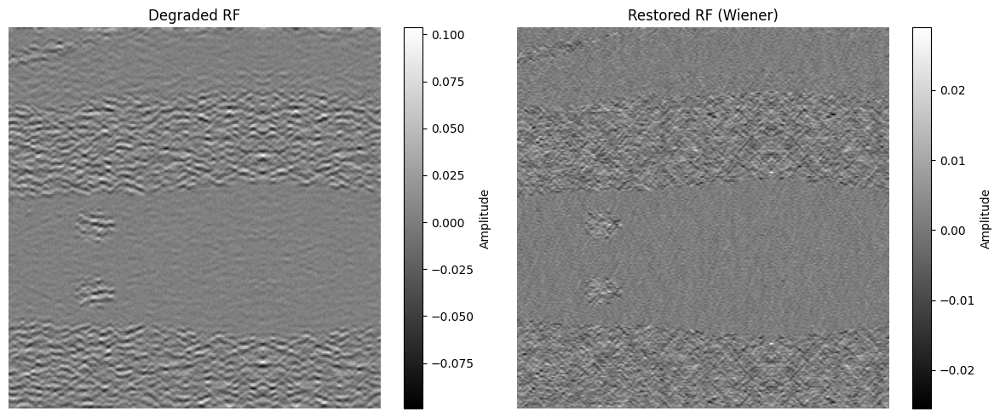

In [39]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# === Load degraded RF and PSF ===
degraded_mat = scipy.io.loadmat("input/Simu/1/degraded_y0.mat")
rf_degraded = degraded_mat["rf_degraded"]

psf_mat = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")
psf = psf_mat["psf_ref"]

# === Normalize PSF: max(abs) = 1 ===
psf_norm = psf / (np.max(np.abs(psf)) + 1e-8)

# === Wiener Deconvolution Function ===
def wiener_deconvolution(y: np.ndarray, psf: np.ndarray, K: float = 0.01) -> np.ndarray:
    H, W = y.shape
    Mh, Nh = psf.shape

    # Zero-pad and center PSF
    padded = np.zeros((H, W), dtype=np.float32)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    # FFTs
    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)

    # Wiener filter
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft

    # Inverse FFT
    x_restored = np.real(np.fft.ifft2(X_hat))
    return x_restored

# === Apply Wiener Deconvolution ===
restored_rf = wiener_deconvolution(rf_degraded, psf_norm, K=0.3)
rf_restored_norm = 2 * (restored_rf - restored_rf.min()) / (restored_rf.max() - restored_rf.min() + 1e-8) - 1

# === Save restored RF ===
scipy.io.savemat("input/Simu/1/restored_rf_wiener.mat", {"rf_restored": restored_rf})
print("✅ Restored RF saved to input/Simu/1/restored_rf_wiener.mat")

# === Visualize Original vs Restored RF ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(rf_degraded, cmap='gray', aspect='auto')
plt.title("Degraded RF")
plt.colorbar(label='Amplitude')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(restored_rf, cmap='gray', aspect='auto')
plt.title("Restored RF (Wiener)")
plt.colorbar(label='Amplitude')
plt.axis('off')

plt.tight_layout()
plt.show()


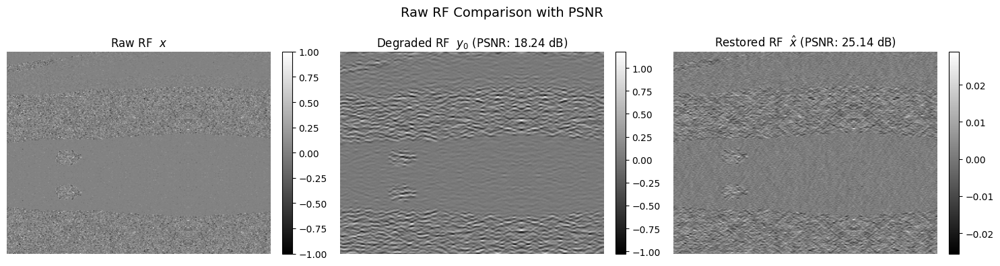

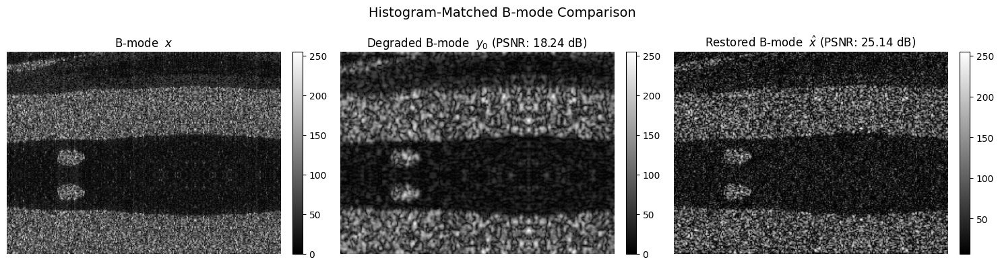

In [42]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio

# === Load Data ===
base_path = "input/Simu/1/ddrm_out"
rf_gt        = scipy.io.loadmat(f"{base_path}/ground_truth.mat")["GT_rf_resized"]
rf_degraded  = scipy.io.loadmat(f"{base_path}/degraded_y0.mat")["rf_degraded"]
rf_restored  = scipy.io.loadmat("input/Simu/1/restored_rf_wiener.mat")["rf_restored"]
gt_bmode     = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === Compute PSNR values ===
psnr_degraded = peak_signal_noise_ratio(rf_gt, rf_degraded, data_range=rf_gt.max() - rf_gt.min())
psnr_restored = peak_signal_noise_ratio(rf_gt, rf_restored, data_range=rf_gt.max() - rf_gt.min())

# === Helper: Convert RF to histogram-matched B-mode ===
def rf_to_matched_bmode(RF, GT_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + increase)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Convert to B-mode ===
b_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
b_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
b_restored = rf_to_matched_bmode(rf_restored, gt_bmode)

# === Plot Raw RF ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "Raw RF  $x$",
    f"Degraded RF  $y_0$ (PSNR: {psnr_degraded:.2f} dB)",
    f"Restored RF  $\hat{{x}}$ (PSNR: {psnr_restored:.2f} dB)"
]
images = [rf_gt, rf_degraded, rf_restored]

for ax, img, title in zip(axs, images, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle("Raw RF Comparison with PSNR", fontsize=14)
plt.tight_layout()
plt.show()

# === Plot B-mode ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "B-mode  $x$",
    f"Degraded B-mode  $y_0$ (PSNR: {psnr_degraded:.2f} dB)",
    f"Restored B-mode  $\hat{{x}}$ (PSNR: {psnr_restored:.2f} dB)"
]
images = [b_gt, b_degraded, b_restored]

for ax, img, title in zip(axs, images, titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

plt.suptitle("Histogram-Matched B-mode Comparison", fontsize=14)
plt.tight_layout()
plt.show()


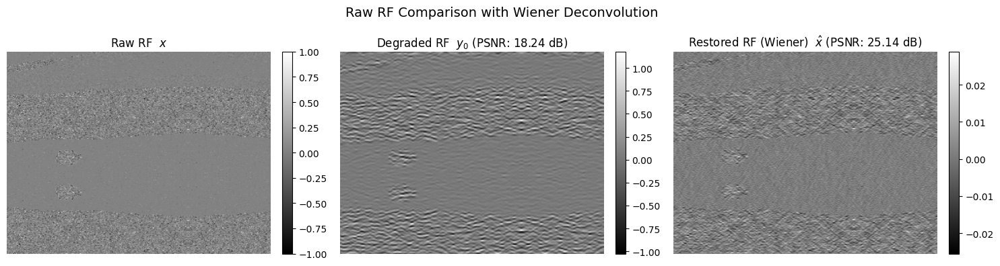

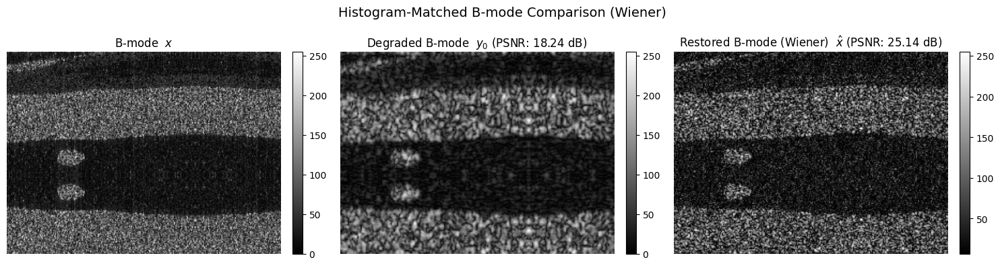

In [43]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio

# === Load Data ===
base_path     = "input/Simu/1/ddrm_out"
rf_gt         = scipy.io.loadmat(f"{base_path}/ground_truth.mat")["GT_rf_resized"]
rf_degraded   = scipy.io.loadmat(f"{base_path}/degraded_y0.mat")["rf_degraded"]
rf_restored   = scipy.io.loadmat("input/Simu/1/restored_rf_wiener.mat")["rf_restored"]
gt_bmode      = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === Compute PSNR values ===
psnr_degraded = peak_signal_noise_ratio(rf_gt, rf_degraded, data_range=rf_gt.max() - rf_gt.min())
psnr_restored = peak_signal_noise_ratio(rf_gt, rf_restored, data_range=rf_gt.max() - rf_gt.min())

# === Helper: Convert RF to histogram-matched B-mode ===
def rf_to_matched_bmode(RF, GT_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + increase)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Convert to B-mode ===
b_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
b_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
b_restored = rf_to_matched_bmode(rf_restored, gt_bmode)

# === Plot Raw RF ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "Raw RF  $x$",
    f"Degraded RF  $y_0$ (PSNR: {psnr_degraded:.2f} dB)",
    f"Restored RF (Wiener)  $\hat{{x}}$ (PSNR: {psnr_restored:.2f} dB)"
]
for ax, img, title in zip(axs, [rf_gt, rf_degraded, rf_restored], titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.suptitle("Raw RF Comparison with Wiener Deconvolution", fontsize=14)
plt.tight_layout()
plt.show()

# === Plot B-mode ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "B-mode  $x$",
    f"Degraded B-mode  $y_0$ (PSNR: {psnr_degraded:.2f} dB)",
    f"Restored B-mode (Wiener)  $\hat{{x}}$ (PSNR: {psnr_restored:.2f} dB)"
]
for ax, img, title in zip(axs, [b_gt, b_degraded, b_restored], titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.suptitle("Histogram-Matched B-mode Comparison (Wiener)", fontsize=14)
plt.tight_layout()
plt.show()


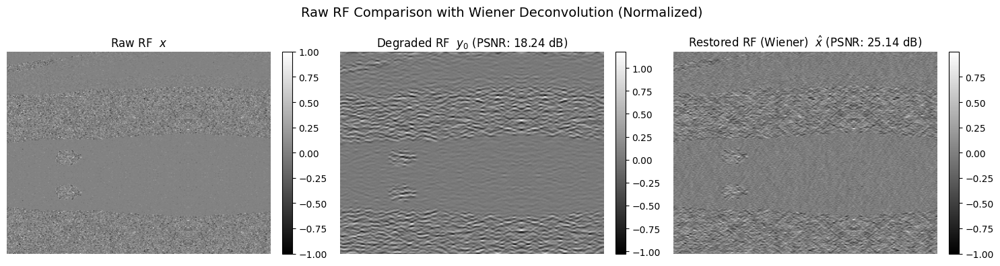

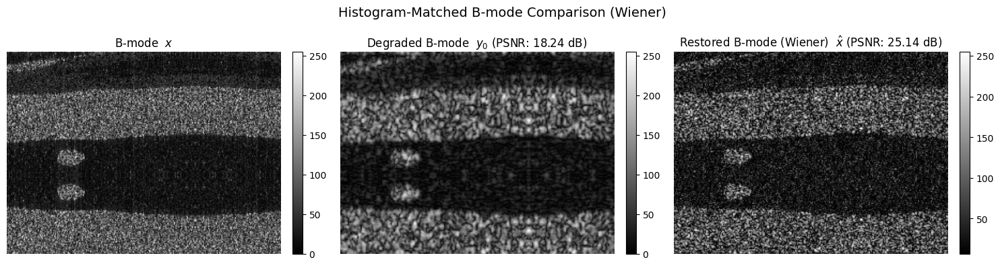

In [44]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio

# === Load Data ===
base_path     = "input/Simu/1/ddrm_out"
rf_gt         = scipy.io.loadmat(f"{base_path}/ground_truth.mat")["GT_rf_resized"]
rf_degraded   = scipy.io.loadmat(f"{base_path}/degraded_y0.mat")["rf_degraded"]
rf_restored   = scipy.io.loadmat("input/Simu/1/restored_rf_wiener.mat")["rf_restored"]
gt_bmode      = scipy.io.loadmat("exp/datasets/anes_data/simu/1/data.mat")["bmode_GT"]

# === Normalize restored RF to [-1, 1] ===
rf_restored_norm = 2 * (rf_restored - rf_restored.min()) / (rf_restored.max() - rf_restored.min() + 1e-8) - 1

# === Compute PSNR values ===
psnr_degraded = peak_signal_noise_ratio(rf_gt, rf_degraded, data_range=rf_gt.max() - rf_gt.min())
psnr_restored = peak_signal_noise_ratio(rf_gt, rf_restored, data_range=rf_gt.max() - rf_gt.min())

# === Helper: Convert RF to histogram-matched B-mode ===
def rf_to_matched_bmode(RF, GT_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + increase)
    db = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Convert to B-mode ===
b_gt       = rf_to_matched_bmode(rf_gt, gt_bmode)
b_degraded = rf_to_matched_bmode(rf_degraded, gt_bmode)
b_restored = rf_to_matched_bmode(rf_restored, gt_bmode)

# === Plot Raw RF ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "Raw RF  $x$",
    f"Degraded RF  $y_0$ (PSNR: {psnr_degraded:.2f} dB)",
    f"Restored RF (Wiener)  $\hat{{x}}$ (PSNR: {psnr_restored:.2f} dB)"
]
for ax, img, title in zip(axs, [rf_gt, rf_degraded, rf_restored_norm], titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.suptitle("Raw RF Comparison with Wiener Deconvolution (Normalized)", fontsize=14)
plt.tight_layout()
plt.show()

# === Plot B-mode ===
fig, axs = plt.subplots(1, 3, figsize=(15, 4))
titles = [
    "B-mode  $x$",
    f"Degraded B-mode  $y_0$ (PSNR: {psnr_degraded:.2f} dB)",
    f"Restored B-mode (Wiener)  $\hat{{x}}$ (PSNR: {psnr_restored:.2f} dB)"
]
for ax, img, title in zip(axs, [b_gt, b_degraded, b_restored], titles):
    im = ax.imshow(img, cmap="gray", aspect="auto")
    ax.set_title(title)
    ax.axis("off")
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
plt.suptitle("Histogram-Matched B-mode Comparison (Wiener)", fontsize=14)
plt.tight_layout()
plt.show()
